In [1]:
import scipy.io
from scipy.io import loadmat
from matplotlib import pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
import mne 

# Load matlab eeg signal 
mat_data = scipy.io.loadmat('/Users/kimying/Downloads/FYP /Data/filtered_data/Arithmetic_sub_1_trial1.mat')
mat_data

# Print EEG data
con_list = [[element for element in upperElement] for upperElement in mat_data['Clean_data']]
len(con_list[0])

3200

In [2]:
# return list of all the keys within the dictionary 
mat_data.keys()
mat_data['Clean_data']
len(mat_data['Clean_data'][1])

3200

Creating RawArray with float64 data, n_channels=32, n_times=3200
    Range : 0 ... 3199 =      0.000 ...    24.992 secs
Ready.


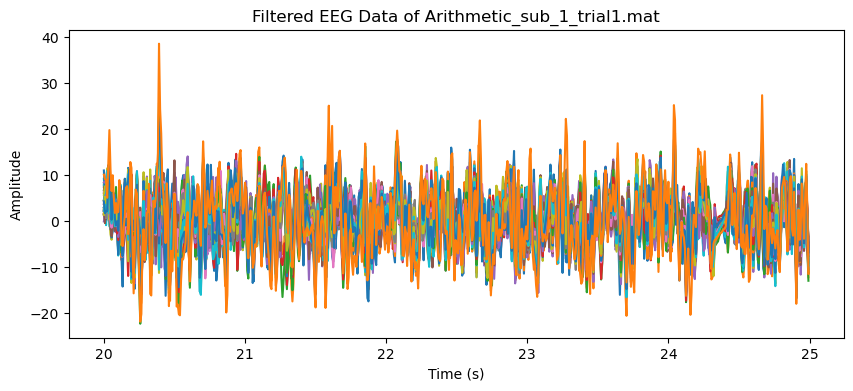

Creating RawArray with float64 data, n_channels=32, n_times=3200
    Range : 0 ... 3199 =      0.000 ...    24.992 secs
Ready.


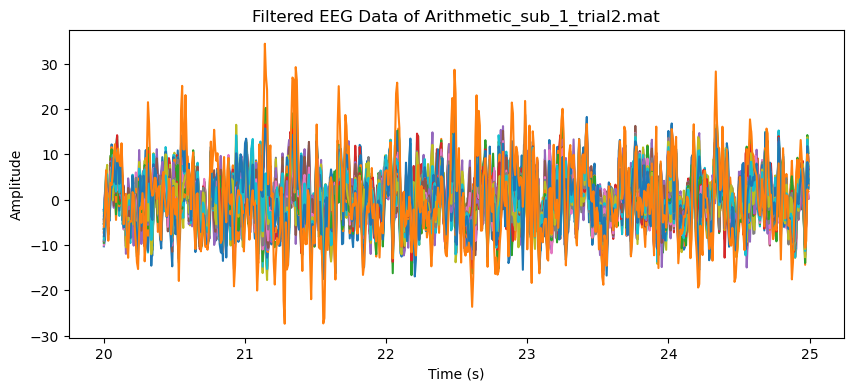

Creating RawArray with float64 data, n_channels=32, n_times=3200
    Range : 0 ... 3199 =      0.000 ...    24.992 secs
Ready.


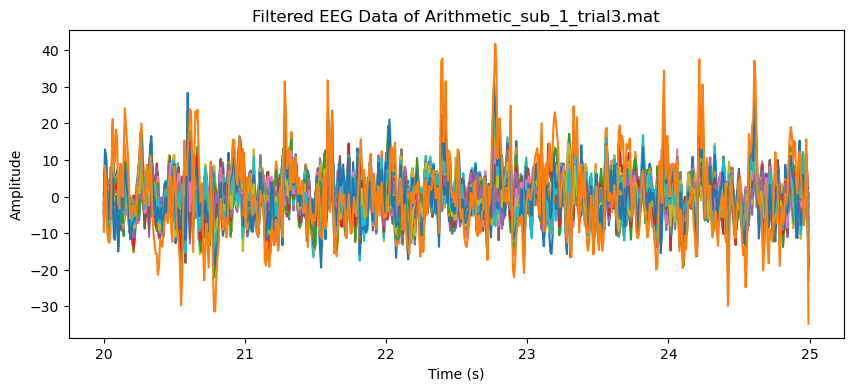

In [3]:
import os
import re

os.chdir("/Users/kimying/Downloads/FYP /Data/filtered_data")
files = os.listdir()

#return natural keys 
def atoi(text):
    return int(text) if text.isdigit() else text

def natural_keys(text):
    '''
    alist.sort(key=natural_keys) sorts in human order
    http://nedbatchelder.com/blog/200712/human_sorting.html
    (See Toothy's implementation in the comments)
    '''
    return [ atoi(c) for c in re.split(r'(\d+)', text) ]

#sorted the files 
files = sorted(files)
files = [file for file in files if file != ".DS_Store" and "Relax" not in file]
files.sort(key=natural_keys)

#Load the MATLAB .mat file
for file in files[:3]:
    data = loadmat('/Users/kimying/Downloads/FYP /Data/filtered_data/' + file)

    # Extract the EEG data and sampling frequency from the loaded data
    eeg_data = data['Clean_data']
    sfreq = 128

    channels = "CZ, FZ, Fp1, F7, F3, FC1, C3, FC5, FT9, T7, CP5, CP1, P3, P7, PO9, O1, PZ, OZ, O2, PO10, P8, P4, CP2, CP6, T8, FT10, FC6, C4, FC2, F4, F8, Fp2"
    channels = channels.split(',')
    channels = [i.strip() for i in channels]

    # Transpose the EEG data if necessary
    if eeg_data.shape[0] > eeg_data.shape[1]:
        eeg_data = eeg_data.T

    # Ensure the number of channels matches the data shape
    if len(channels) != eeg_data.shape[0]:
        raise ValueError("Number of channels does not match the data shape.")

    # Create a RawArray object from the EEG data
    info = mne.create_info(ch_names=channels, sfreq=sfreq, ch_types='eeg')
    raw = mne.io.RawArray(eeg_data, info)

    # Specify the time range for the plot (in seconds)
    start_time = 20
    end_time = 50

    # Extract the data and time vector for the specified time range
    data, times = raw[:, int(start_time * sfreq):int(end_time * sfreq)]

    # Create the plot
    plt.figure(figsize=(10, 4))
    plt.plot(times, data.T)
    plt.xlabel('Time (s)')
    plt.ylabel('Amplitude')
    plt.title('Filtered EEG Data of ' + file)
    plt.show()

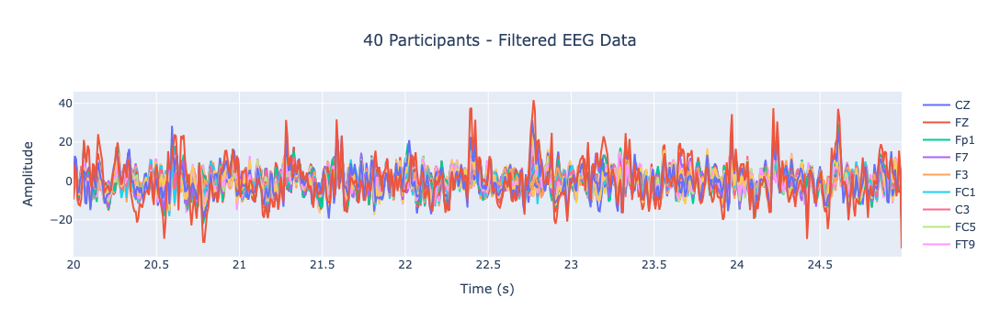

In [4]:
import plotly.graph_objs as go
import plotly.offline as py

# Create the Plotly plot
trace_data = []
for i in range(data.shape[0]):
        trace = go.Scatter(x=times, y=data[i, :], name=channels[i])
        trace_data.append(trace)

layout = go.Layout(title=dict(text=f'40 Participants - Filtered EEG Data', x=0.5),
                       xaxis=dict(title='Time (s)'),
                       yaxis=dict(title='Amplitude'),
                       showlegend=True)

fig = go.Figure(data=trace_data, layout=layout)
py.iplot(fig)

# CODE FOR LIST

In [5]:
from statistics import mean

channels =  "CZ, FZ, Fp1, F7, F3, FC1, C3, FC5, FT9, T7, CP5, CP1, P3, P7, PO9, O1, PZ, OZ, O2, PO10, P8, P4, CP2, CP6, T8, FT10, FC6, C4, FC2, F4, F8, Fp2"
channels = channels.split(',')
channels = [i.strip() for i in channels]

df = pd.DataFrame(columns = channels)

big_list = []
med_list = []

for i, file in enumerate(files):
    mat_data = scipy.io.loadmat(file)
    con_list = [[element for element in upperElement] for upperElement in mat_data['Clean_data']]
    med_list = []
    for channel in con_list:
        med_list.append(channel)
    big_list.append(med_list)

# Feature Extraction

In [7]:
# A function to extract PSD features using FFT
def extract_psd_features_fft(channel, fs, file):
    file = file[:-5]
    # Fast Fourier Transform (FFT)
    freq_domain = np.fft.fft(channel)
    # Compute the Power Spectral Density
    psd = np.abs(freq_domain) ** 2
    # Extract the frequency axis from the FFT 
    freq_axis = np.fft.fftfreq(len(channel), 1/fs)

     # Compute the average power in specific frequency bands
    eeg_bands = {
        'Delta': (1, 4),
        'Theta': (4, 8),
        'Alpha': (8, 12),
        'Beta': (12, 30),
        'Gamma': (30, 45)
    }
    # Take the mean of the fft amplitude for each EEG band
    eeg_band_fft = dict()
    for band in eeg_bands:
        freq_ix = np.where((freq_axis >= eeg_bands[band][0]) &
                           (freq_axis <= eeg_bands[band][1]))[0]
        eeg_band_fft[band] = np.mean(psd[freq_ix])
    
    # Plot the data using pandas
    df = pd.DataFrame(list(eeg_band_fft.items()), columns=['band', 'val'])
    
    # Assign colors to the bars
    colors = ['blue', 'orange', 'green', 'red', 'purple']  
    ax = df.plot.bar(x='band', y='val', color=colors, legend=False)
    ax.set_xlabel("EEG band")
    ax.set_ylabel("Mean band Amplitude")
    ax.set_title("Fast Fourier Transform of " + file)
    
    # Return the extracted PSD features 
    return ["%.2f" % value for value in eeg_band_fft.values()]

plt.rcParams.update({'figure.max_open_warning': 0})

FFT features list:
Arithmetic_sub_1_trial1 ['164636.87', '161365.44', '139227.95', '84548.54', '79344.62']
Arithmetic_sub_1_trial2 ['158594.32', '160485.64', '143288.01', '77333.20', '68759.03']
Arithmetic_sub_1_trial3 ['180979.90', '174937.48', '148450.15', '87034.26', '62495.43']
Arithmetic_sub_2_trial1 ['108251.12', '112260.83', '113017.72', '87224.49', '67443.32']
Arithmetic_sub_2_trial2 ['110228.51', '121507.37', '123667.19', '75748.25', '55439.63']
Arithmetic_sub_2_trial3 ['82414.78', '87369.47', '90103.24', '68154.48', '58870.74']
Arithmetic_sub_3_trial1 ['237501.79', '218129.91', '175277.87', '107289.08', '89471.46']
Arithmetic_sub_3_trial2 ['249289.03', '240336.98', '201410.65', '120656.58', '63905.84']
Arithmetic_sub_3_trial3 ['202055.78', '191898.21', '160022.42', '104361.34', '75888.70']
Arithmetic_sub_4_trial1 ['144099.02', '162049.10', '179805.74', '109556.19', '60266.01']
Arithmetic_sub_4_trial2 ['114522.05', '123731.25', '132469.89', '87379.67', '57709.53']
Arithmetic_s

360

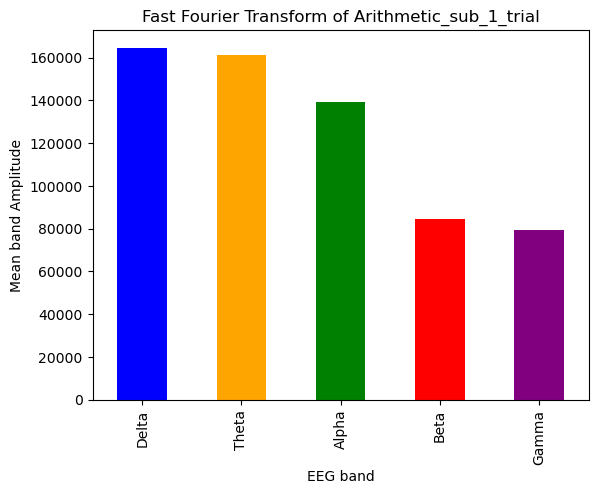

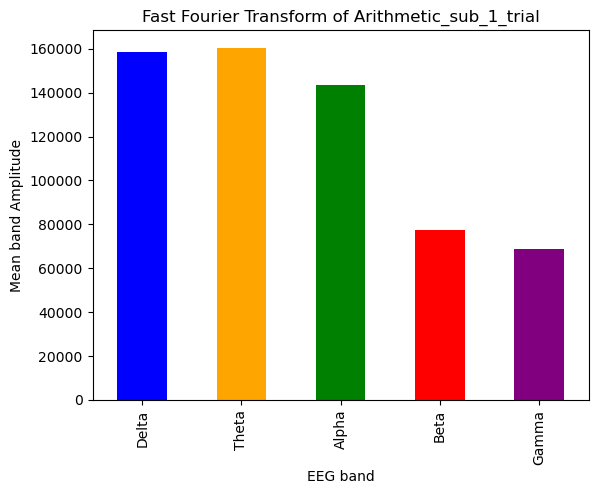

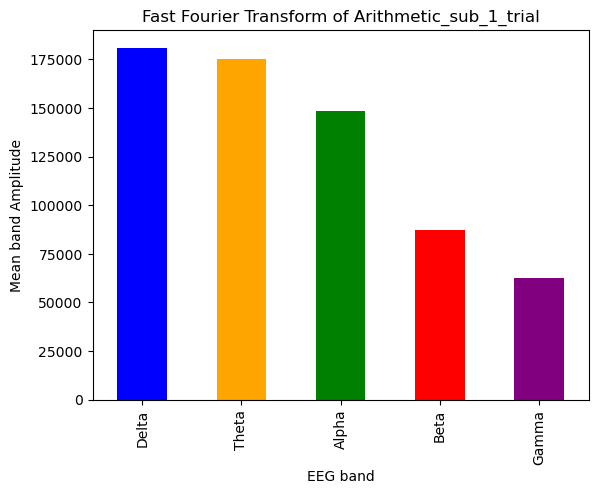

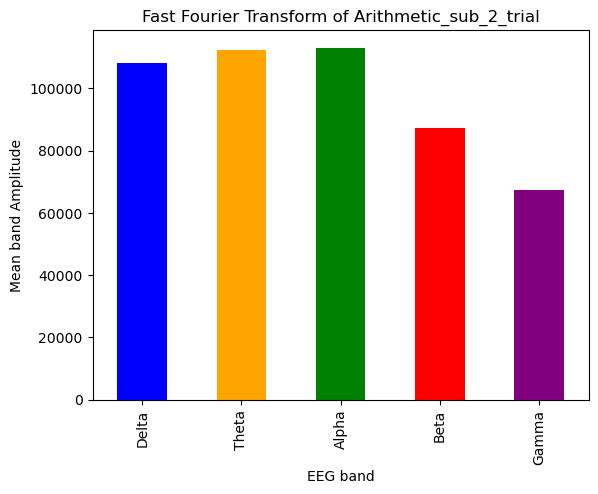

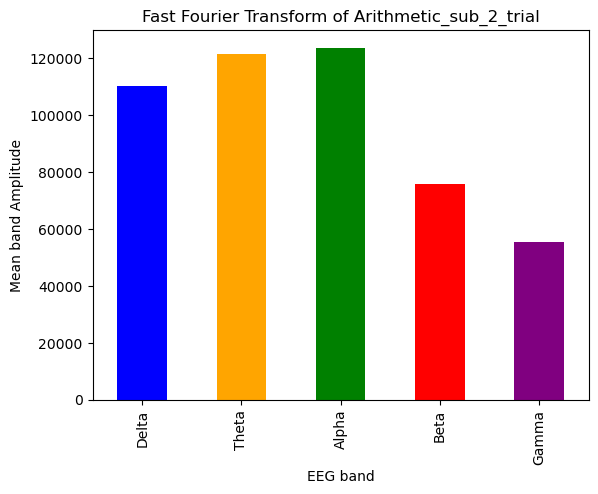

...

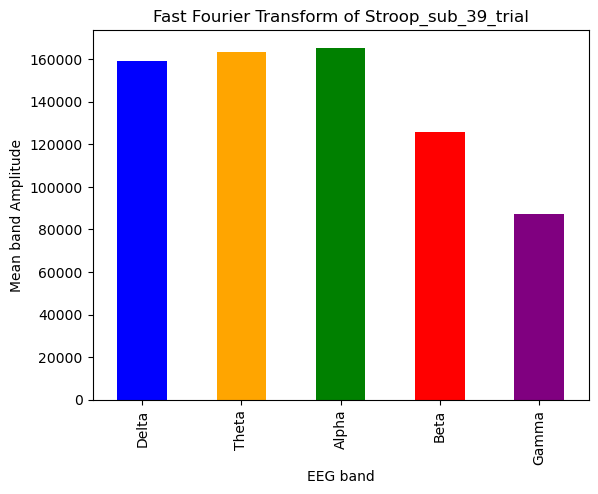

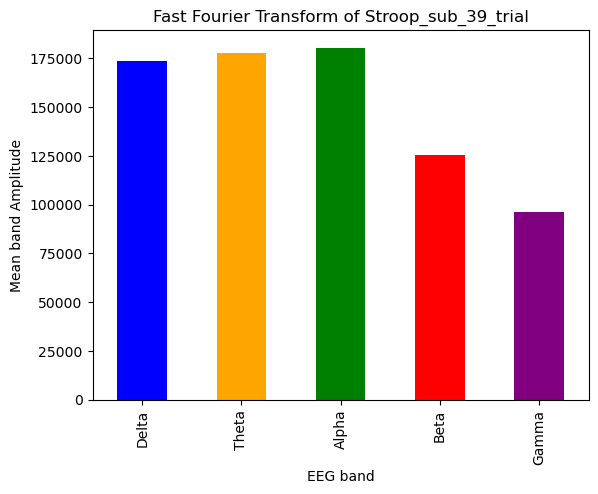

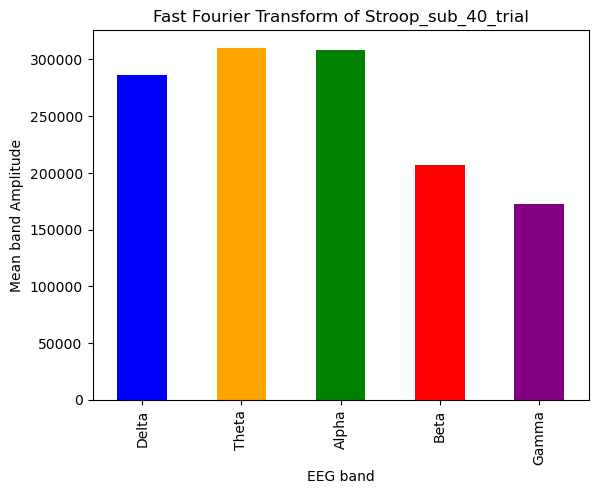

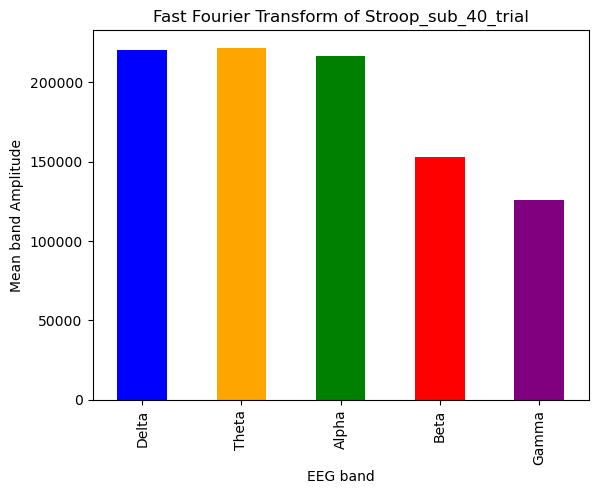

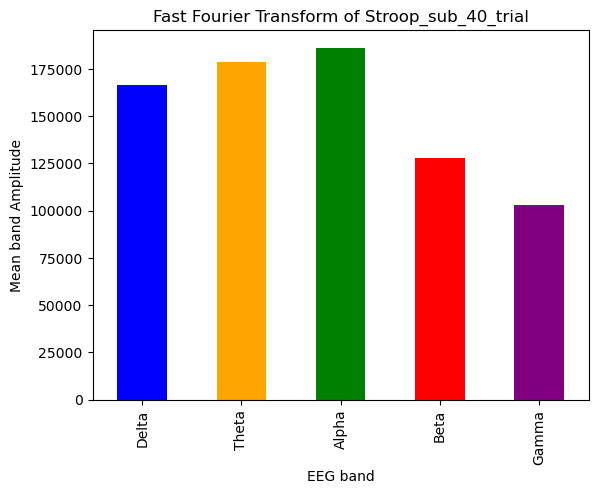

In [8]:
 # Define the sampling rate and channels 
channel = 32
fs = 128

# Perform PSD feature extraction using FFT 
psd_feature_list_fft = []

for i, channel in enumerate(big_list):
    channel_psd_features_fft = extract_psd_features_fft(channel, fs, files[i])
    psd_feature_list_fft.append(channel_psd_features_fft)

# Print the psd_feature_list_fft separately
print("FFT features list:")
for i, psd_features in enumerate(psd_feature_list_fft):
        print(f"{files[i][:-4]} {psd_features}")
len(psd_feature_list_fft)  

# COMBINE PROCESSED DATA WITH TARGET DATA 

In [9]:
targets = pd.read_excel("/Users/kimying/Downloads/FYP /Data/scales.xls")
targets = targets.iloc[:,1:]

# Grab the first row for header and data less the header row 
new_header = targets.iloc[0] 
targets = targets[1:] 
targets.columns = new_header 

targets

,Maths,Symmetry,Stroop,Maths,Symmetry,Stroop,Maths,Symmetry,Stroop
1,6,3,3,7,5,2,4,7,4
2,3,4,5,3,4,4,7,5,3
3,5,3,4,3,5,5,8,7,5
4,5,3,4,3,5,2,7,5,5
5,6,6,6,5,3,2,5,7,3
6,5,4,2,4,3,3,8,6,5
7,5,5,4,3,3,3,6,3,6
8,3,5,4,6,6,3,5,6,3
9,3,6,4,4,4,4,7,4,6
10,3,4,4,4,5,3,6,4,5


In [10]:
arithmetic = []

# Arithmetic problem solving task
counter = 0
for i in range(len(targets)):
    for j in range(0, 9, 3):
        arithmetic.append(targets.iloc[i,j])
arithmetic


[6,
 7,
 4,
 3,
 3,
 7,
 5,
 3,
 8,
 5,
 3,
 7,
 6,
 5,
 5,
 5,
 4,
 8,
 5,
 3,
 6,
 3,
 6,
 5,
 3,
 4,
 7,
 3,
 4,
 6,
 7,
 6,
 5,
 5,
 5,
 8,
 3,
 3,
 3,
 3,
 6,
 6,
 9,
 7,
 6,
 4,
 5,
 8,
 8,
 6,
 7,
 6,
 5,
 9,
 4,
 2,
 4,
 10,
 10,
 10,
 7,
 8,
 7,
 9,
 8,
 7,
 3,
 4,
 8,
 4,
 2,
 5,
 2,
 2,
 5,
 6,
 6,
 4,
 5,
 3,
 5,
 7,
 7,
 6,
 6,
 8,
 6,
 7,
 8,
 7,
 10,
 9,
 6,
 5,
 1,
 7,
 5,
 3,
 8,
 2,
 3,
 2,
 6,
 5,
 4,
 4,
 5,
 5,
 6,
 5,
 8,
 6,
 5,
 4,
 6,
 5,
 6,
 3,
 4,
 4]

In [11]:
# Mirrror image recognition task
mirror = []
counter = 0
for i in range(len(targets)):
    for j in range(1, 9, 3):
        mirror.append(targets.iloc[i,j])
mirror

[3,
 5,
 7,
 4,
 4,
 5,
 3,
 5,
 7,
 3,
 5,
 5,
 6,
 3,
 7,
 4,
 3,
 6,
 5,
 3,
 3,
 5,
 6,
 6,
 6,
 4,
 4,
 4,
 5,
 4,
 3,
 5,
 6,
 7,
 4,
 6,
 5,
 4,
 5,
 4,
 4,
 3,
 6,
 5,
 5,
 4,
 6,
 5,
 9,
 8,
 7,
 5,
 6,
 6,
 6,
 4,
 1,
 9,
 9,
 8,
 8,
 8,
 8,
 8,
 8,
 6,
 2,
 2,
 4,
 2,
 1,
 7,
 1,
 1,
 7,
 7,
 8,
 5,
 5,
 4,
 3,
 8,
 7,
 5,
 7,
 7,
 6,
 6,
 6,
 5,
 8,
 7,
 3,
 5,
 2,
 6,
 4,
 2,
 3,
 3,
 1,
 2,
 5,
 2,
 6,
 4,
 4,
 5,
 5,
 3,
 4,
 4,
 6,
 5,
 4,
 5,
 3,
 5,
 6,
 4]

In [12]:
#Stroop color word test
stroop = []
counter = 0
for i in range(len(targets)):
    for j in range(2, 9, 3):
        stroop.append(targets.iloc[i,j])
stroop

[3,
 2,
 4,
 5,
 4,
 3,
 4,
 5,
 5,
 4,
 2,
 5,
 6,
 2,
 3,
 2,
 3,
 5,
 4,
 3,
 6,
 4,
 3,
 3,
 4,
 4,
 6,
 4,
 3,
 5,
 4,
 5,
 5,
 2,
 5,
 3,
 3,
 2,
 1,
 3,
 2,
 4,
 5,
 3,
 5,
 1,
 1,
 6,
 8,
 4,
 6,
 6,
 5,
 7,
 6,
 3,
 3,
 7,
 5,
 6,
 9,
 9,
 9,
 5,
 6,
 5,
 1,
 1,
 5,
 1,
 1,
 4,
 2,
 2,
 5,
 8,
 7,
 6,
 3,
 2,
 3,
 7,
 5,
 4,
 6,
 6,
 5,
 5,
 5,
 4,
 4,
 3,
 7,
 1,
 1,
 3,
 3,
 2,
 6,
 1,
 1,
 3,
 1,
 1,
 5,
 6,
 3,
 5,
 4,
 2,
 6,
 5,
 3,
 3,
 3,
 3,
 5,
 5,
 5,
 3]

In [13]:
final_target = arithmetic + mirror + stroop
final_target

df["targets"] = final_target

for i, psd_features in enumerate(psd_feature_list_fft):
    psd_features.append(df.loc[i,"targets"])
psd_feature_list_fft

[['164636.87', '161365.44', '139227.95', '84548.54', '79344.62', 6],
 ['158594.32', '160485.64', '143288.01', '77333.20', '68759.03', 7],
 ['180979.90', '174937.48', '148450.15', '87034.26', '62495.43', 4],
 ['108251.12', '112260.83', '113017.72', '87224.49', '67443.32', 3],
 ['110228.51', '121507.37', '123667.19', '75748.25', '55439.63', 3],
 ['82414.78', '87369.47', '90103.24', '68154.48', '58870.74', 7],
 ['237501.79', '218129.91', '175277.87', '107289.08', '89471.46', 5],
 ['249289.03', '240336.98', '201410.65', '120656.58', '63905.84', 3],
 ['202055.78', '191898.21', '160022.42', '104361.34', '75888.70', 8],
 ['144099.02', '162049.10', '179805.74', '109556.19', '60266.01', 5],
 ['114522.05', '123731.25', '132469.89', '87379.67', '57709.53', 3],
 ['131538.41', '140445.71', '150329.48', '100042.97', '40823.58', 7],
 ['185856.50', '190309.18', '174064.97', '108558.36', '106537.81', 6],
 ['194303.18', '198135.51', '178135.79', '106887.52', '98909.38', 5],
 ['156971.26', '151859.01', '

In [14]:
df_features = pd.DataFrame(psd_feature_list_fft, columns=["Delta Band", "Tetha Band", "Alpha Band", "Beta Band", "Gamma Band", "Target"])
df_features


,Delta Band,Tetha Band,Alpha Band,Beta Band,Gamma Band,Target
0,164636.87,161365.44,139227.95,84548.54,79344.62,6
1,158594.32,160485.64,143288.01,77333.20,68759.03,7
2,180979.90,174937.48,148450.15,87034.26,62495.43,4
3,108251.12,112260.83,113017.72,87224.49,67443.32,3
4,110228.51,121507.37,123667.19,75748.25,55439.63,3
...,...,...,...,...,...,...
355,159306.74,163420.77,165355.63,125800.93,87469.27,3
356,173408.70,177546.30,180399.09,125310.00,96151.95,5
357,286514.72,310279.77,308663.39,206673.76,172938.78,5
358,220162.11,221740.38,216281.59,152837.51,126019.96,5


# LSTM  

In [17]:
 from sklearn.model_selection import train_test_split

# Split the data into training and testing sets
X_train, X_test, Y_train, Y_test = train_test_split(df_features, df_features["Target"], test_size=0.2, random_state=42)

# Reshape the feature vectors for LSTM input
x_train = X_train.values.reshape(X_train.shape[0], 1, X_train.shape[1])
x_test = X_test.values.reshape(X_test.shape[0], 1, X_test.shape[1])

# Print the shapes of the resulting sets
print("Training set shape:", x_train.shape, Y_train.shape)  
print("Testing set shape:", x_test.shape, Y_test.shape)  

Training set shape: (288, 1, 6) (288,)
Testing set shape: (72, 1, 6) (72,)


In [18]:
import tensorflow as tf
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Dense, Dropout, LSTM
from keras.optimizers import Adam
from sklearn.metrics import accuracy_score

# Assuming y_train and y_test are defined correctly
tf.keras.backend.clear_session()

model = Sequential()
model.add(LSTM(64, input_shape=(1, 2548), activation="relu", return_sequences=True))
model.add(Dropout(0.2))
model.add(LSTM(32, activation="sigmoid"))
model.add(Dropout(0.2))
model.add(Dense(3, activation='sigmoid'))

model.compile(loss='categorical_crossentropy', optimizer=Adam(), metrics=['accuracy'])
model.summary()

history = model.fit(x_train, y_train, epochs=100, validation_data=(x_test, y_test))
score, acc = model.evaluate(x_test, y_test)

# Use y_test for evaluation
pred = model.predict(x_test)
predict_classes = np.argmax(pred, axis=1)
expected_classes = np.argmax(y_test, axis=1)

correct = accuracy_score(expected_classes, predict_classes)
print(f"Testing Accuracy: {correct}")


2023-11-14 23:12:41.480821: E tensorflow/core/lib/monitoring/collection_registry.cc:81] Cannot register 2 metrics with the same name: /tensorflow/api/keras/optimizers


AlreadyExistsError: Another metric with the same name already exists.

In [19]:
import tensorflow as tf
from keras.models import Sequential
from keras.layers import LSTM, Dense, Dropout
from keras.optimizers import Adam

# Define the LSTM model
model = Sequential()
model.add(LSTM(32, input_shape=(1, x_train.shape[2]), activation="tanh"))
model.add(Dropout(0.2))
model.add(Dense(3, activation='softmax'))

# Compile the model
model.compile(loss='categorical_crossentropy', optimizer=Adam(learning_rate=0.001), metrics=['accuracy'])

# Train the model with further reduced batch size and epochs
history = model.fit(x_train, Y_train, epochs=3, batch_size=16, validation_data=(x_test, Y_test))

# Evaluate the model
loss, accuracy = model.evaluate(x_test, Y_test)
print(f"Test loss: {loss}")
print(f"Test accuracy: {accuracy}")


2023-11-14 23:12:42.030043: E tensorflow/core/lib/monitoring/collection_registry.cc:81] Cannot register 2 metrics with the same name: /tensorflow/api/keras/optimizers


AlreadyExistsError: Another metric with the same name already exists.